In [1]:
import os
from glob import glob
import torch
import shutil
from tqdm import tqdm
import numpy as np
import nibabel
from monai.transforms import (
    Compose,
    LoadImaged,
    ToTensord,
    EnsureChannelFirstD,
    Resized,
    ToTensord,
    Spacingd,
    Orientationd,
    ScaleIntensityRanged,
    CropForegroundd,
    ResizeWithPadOrCropd

    )
from monai.data import Dataset, DataLoader, CacheDataset
from monai.utils import set_determinism
from monai.utils import first
import matplotlib.pyplot as plt

In [2]:
print(torch.cuda.is_available())
print(torch.version.cuda)
print(torch.cuda.get_device_name(0))

True
12.1
NVIDIA GeForce RTX 3060


In [3]:
import monai
print(dir(monai.transforms))


['Activations', 'ActivationsD', 'ActivationsDict', 'Activationsd', 'AddCoordinateChannels', 'AddCoordinateChannelsD', 'AddCoordinateChannelsDict', 'AddCoordinateChannelsd', 'AddExtremePointsChannel', 'AddExtremePointsChannelD', 'AddExtremePointsChannelDict', 'AddExtremePointsChanneld', 'AdjustContrast', 'AdjustContrastD', 'AdjustContrastDict', 'AdjustContrastd', 'Affine', 'AffineD', 'AffineDict', 'AffineGrid', 'Affined', 'ApplyPending', 'ApplyPendingD', 'ApplyPendingDict', 'ApplyPendingd', 'AsChannelLast', 'AsChannelLastD', 'AsChannelLastDict', 'AsChannelLastd', 'AsDiscrete', 'AsDiscreteD', 'AsDiscreteDict', 'AsDiscreted', 'BatchInverseTransform', 'BorderPad', 'BorderPadD', 'BorderPadDict', 'BorderPadd', 'BoundingRect', 'BoundingRectD', 'BoundingRectDict', 'BoundingRectd', 'CastToType', 'CastToTypeD', 'CastToTypeDict', 'CastToTyped', 'CenterScaleCrop', 'CenterScaleCropD', 'CenterScaleCropDict', 'CenterScaleCropd', 'CenterSpatialCrop', 'CenterSpatialCropD', 'CenterSpatialCropDict', 'Cen

In [ ]:
def prepare(in_dir, pixdim=(1.5, 1.5, 2.0), a_min=-200, a_max=200, spatial_size=(256, 256, 128), cache=False):

    set_determinism(seed=0)

    Train_images = sorted(glob(os.path.join(in_dir, 'TrainVolumes', '*.nii.gz')))
    Train_labels = sorted(glob(os.path.join(in_dir, 'TrainSegmentation', '*.nii.gz')))

    val_images = sorted(glob(os.path.join(in_dir, 'TestVolumes', '*.nii.gz')))
    val_labels = sorted(glob(os.path.join(in_dir, 'TestSegmentation', '*.nii.gz')))

    Train_files = [{"image": image_name, "label": label_name} for image_name, label_name in zip(Train_images, Train_labels)]
    Val_files = [{"image": image_name, "label": label_name} for image_name, label_name in zip(val_images, val_labels)]

    print(Train_files)
    print(Val_files)

   # resimleri yükle
   # bazı dönüşümler (transform) yap
   # bunları torch tensörlerine dönüştürmemiz gerekiyor
   # sözlük (dictionary) kullandığımız için LoadImaged kullanıyoruz

    train_transforms = Compose(
        [
            LoadImaged(keys=["image", "label"]),
            EnsureChannelFirstD(keys=["image", "label"]),  # ensure channel dimension is first
            Spacingd(keys=["image", "label"], pixdim=pixdim),
            ScaleIntensityRanged(keys=["image"], a_min=a_min, a_max=a_max, b_min=0.0, b_max=1.0, clip=True),
            CropForegroundd(keys=["image", "label"], source_key="image"),
            ResizeWithPadOrCropd(keys=["image", "label"], spatial_size=spatial_size),  # resize to a fixed size
            ToTensord(keys=["image", "label"])
        ]
    )

    val_transforms = Compose(
        [
            LoadImaged(keys=["image", "label"]),
            EnsureChannelFirstD(keys=["image", "label"]),
            Spacingd(keys=["image", "label"], pixdim=pixdim),
            ScaleIntensityRanged(keys=["image"], a_min=a_min, a_max=a_max, b_min=0.0, b_max=1.0, clip=True), # ensure channel dimension is first
            CropForegroundd(keys=["image", "label"], source_key="label"),
            ResizeWithPadOrCropd(keys=["image", "label"], spatial_size=spatial_size),  # resize to a fixed size
            ToTensord(keys=["image", "label"])
        ]
    )
    if cache:
        train_ds = CacheDataset(data=Train_files, transform=train_transforms, cache_rate=1.0)
        train_loader = DataLoader(train_ds, batch_size=1)

        test_ds = CacheDataset(data=Val_files, transform=val_transforms, cache_rate=1.0)
        test_loader = DataLoader(test_ds, batch_size=1)

        return train_loader, test_loader

    else:
        train_ds = Dataset(data=Train_files, transform=train_transforms)
        train_loader = DataLoader(train_ds, batch_size=1)

        test_ds = Dataset(data=Val_files, transform=val_transforms)
        test_loader = DataLoader(test_ds, batch_size=1)

        return train_loader, test_loader
     

In [3]:
def show_patient(data,Slice_Number=1, train=True,test=False):

    check_patient_train, check_patient_test = data

    view_train_patient = first(check_patient_train)
    view_test_patient = first(check_patient_test)

    if train:
        plt.figure("Visualization Train", (12,6))
        plt.subplot(1, 2, 1)
        plt.title(f"image {Slice_Number}")
        plt.imshow(view_train_patient['image'][0, 0, :, :, Slice_Number], cmap="gray")

        plt.subplot(1, 2, 2)
        plt.title(f"label {Slice_Number}")
        plt.imshow(view_train_patient['label'][0, 0,:, :, Slice_Number])
        plt.show()

    if test:
        plt.figure("Visualization Test", (12,6))
        plt.subplot(1, 2, 1)
        plt.title(f"image {Slice_Number}")
        plt.imshow(view_test_patient['image'][0, 0, :, :, Slice_Number], cmap="gray")

        plt.subplot(1, 2, 2)
        plt.title(f"label {Slice_Number}")
        plt.imshow(view_test_patient['label'][0, 0, :, :, Slice_Number])
        plt.show()
   


[{'image': 'D:/LiverDataset\\TrainVolumes\\liver_0.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_0.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_1.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_1.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_10.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_10.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_100.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_100.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_11.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_11.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_12.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_12.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_13.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_13.nii.gz'}, {'image': 'D:/LiverDataset\\TrainVolumes\\liver_14.nii.gz', 'label': 'D:/LiverDataset\\TrainSegmentation\\liver_14.nii.gz'}, {

c:\Users\BORA\anaconda3\envs\liver_segmentation\lib\site-packages\monai\utils\deprecate_utils.py:321: FutureWarning: monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.
  warn_deprecated(argname, msg, warning_category)


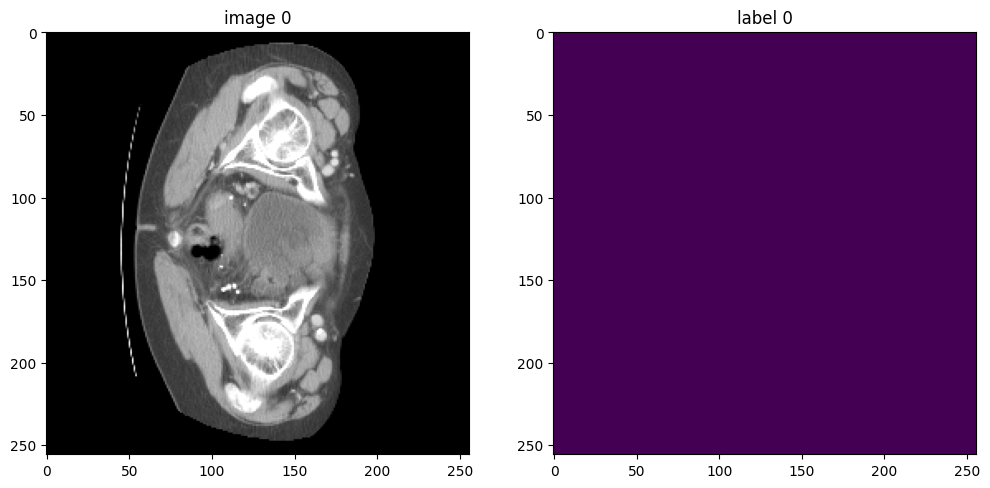

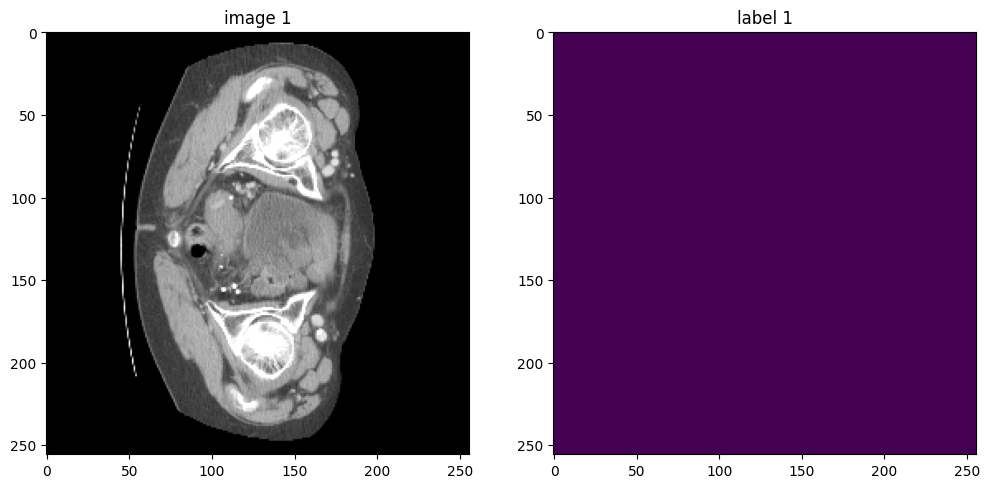

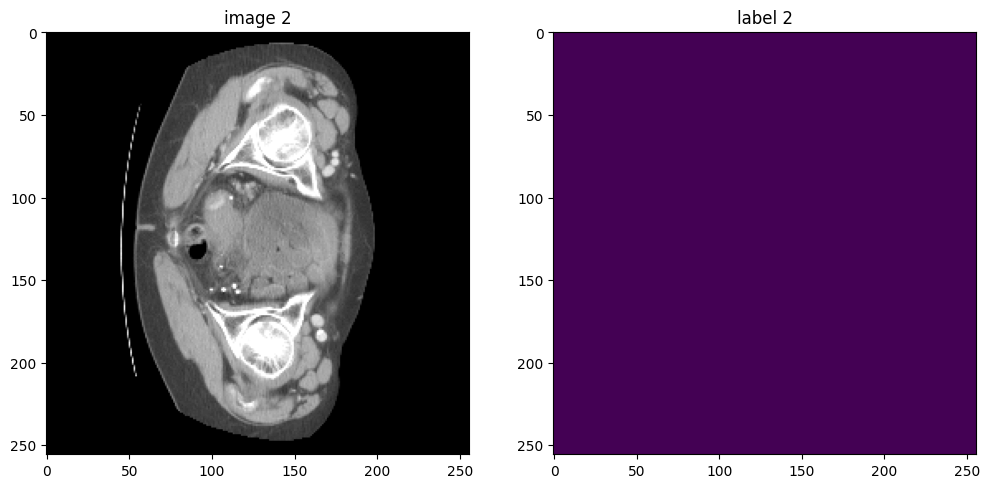

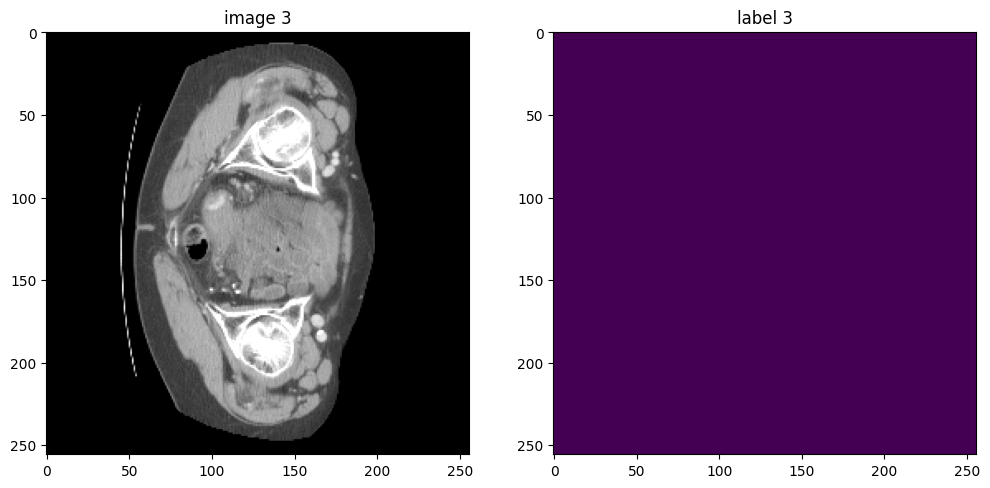

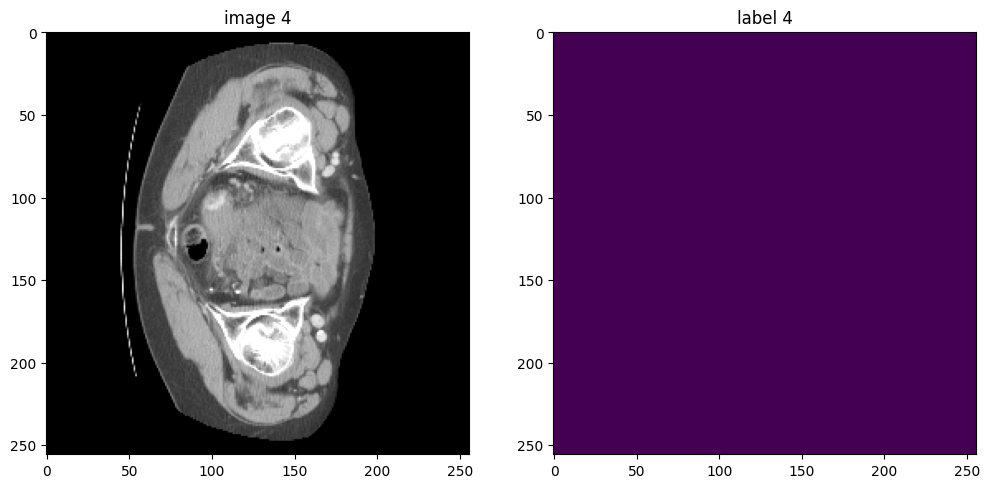

...

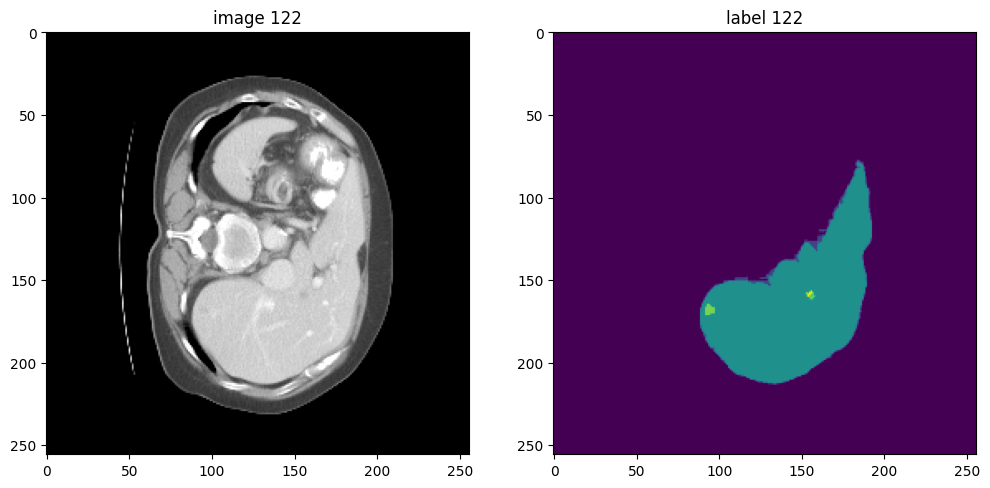

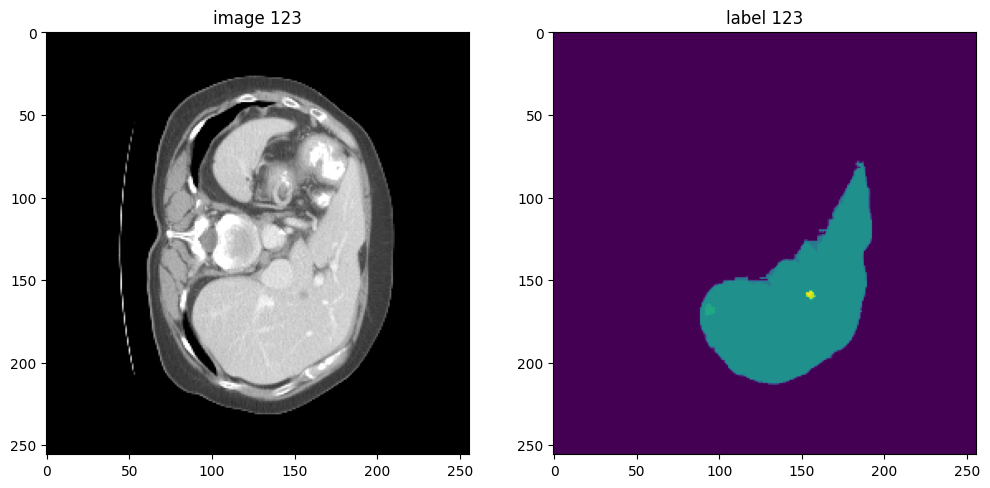

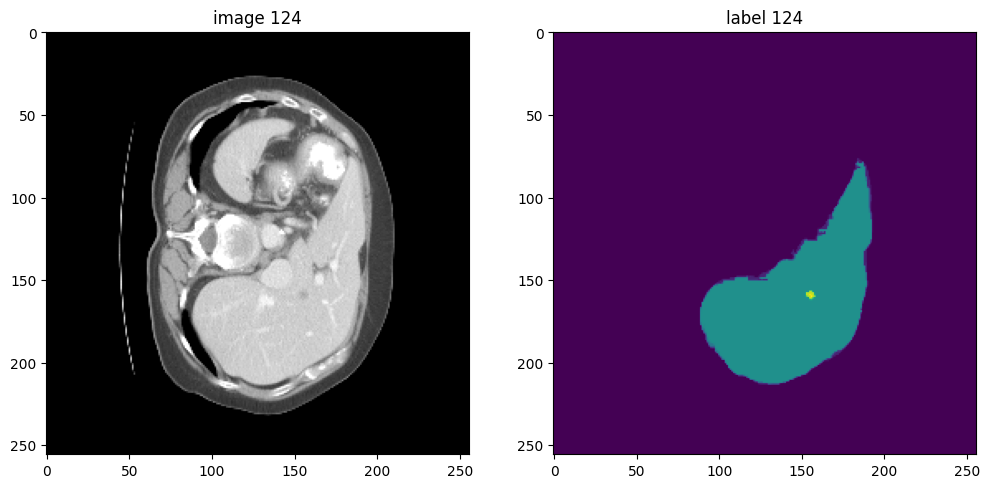

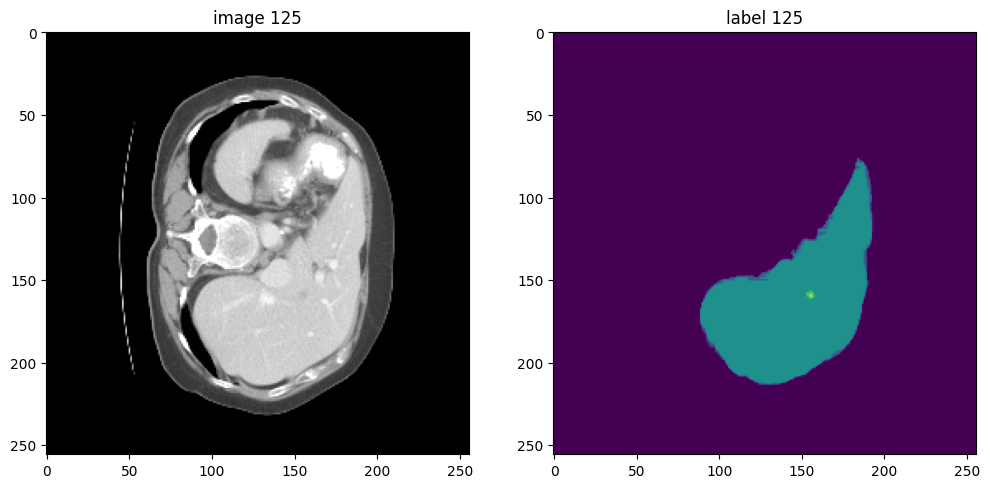

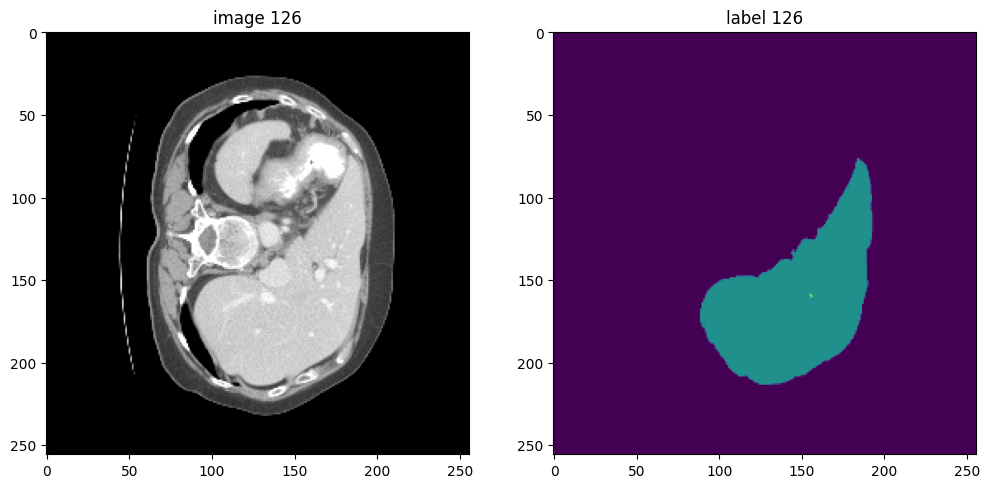

In [ ]:
in_dir ='D:/LiverDataset'
patient = prepare(in_dir)
#show_patient(patient,1)  # sadece ilk hastanın kesitini göster
for i in range(127):  # 0'dan 127'e kadar (127 dahil)
    show_patient(patient, i)